In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as st
plt.style.use('default')

Land is in square miles

In [2]:
dfl = pd.read_csv('../files/land.csv')

dfup = pd.read_csv('../files/usafacts_pop.csv')
dfuc = pd.read_csv('../files/usafacts_cases2.csv')

dfup.rename(columns={'countyFIPS':'fips'}, inplace=True)


dfuc.rename(columns={'countyFIPS':'fips'}, inplace=True)

# dfuc = dfuc.iloc[:,[0,86]]

unique = dfuc.fips.unique()

dfup = dfup.loc[dfup.fips.isin(unique)]

dfl = dfl.loc[dfl.fips.isin(unique)]
dfl = dfl.rename(columns={'LND110210':'land', 'POP060210': 'pop'})

dfuc = dfuc.loc[dfuc.fips != 0]
dfup = dfup.loc[dfup.fips != 0]

dfuc = dfuc.sort_values(by='fips')
dfup = dfup.sort_values(by='fips')
dfuc = dfuc.reset_index(drop=True)
dfup = dfup.reset_index(drop=True)

dfuc = dfuc.drop([0], axis=0)
dfuc = dfuc.reset_index(drop=True)

dfuc = dfuc.drop(columns=['stateFIPS'])

dfu = pd.concat([dfup, dfuc.drop(columns=['fips', 'State', 'County Name'])], axis=1)

dfl = dfl.drop([0], axis=0)
dfl = dfl.reset_index(drop=True)

unique2 = dfl.fips.unique()

dfu = dfu.loc[dfu.fips.isin(unique2)]

dfu = dfu.reset_index(drop=True)

df = pd.concat([dfl, dfu.drop(columns='fips')], axis=1)

df = df.rename(columns={'State':'St'})

df = df.drop(columns='pop')  # drop the 2010 census population density

df['density'] = df.population / df.land

In [3]:
def specialize(row):
    if row.St == 'NY':
        return 'New York'
    elif row.St == 'CA':
        return 'California'
    elif row.St == 'NJ':
        return 'New Jersey'
    elif row.St == 'LA':
        return 'Louisiana'
    elif row.St == 'WA':
        return 'Washington'
    else:
        return 'Other States'

def coast(row):
    if row.St in ['NY', 'NJ', 'CT', 'RI', 'MA', 'PA']:
        return 'East'
    elif row.St in ['CA', 'OR', 'WA']:
        return 'West'
    else:
        return 'Other'
    
    
df['Counties in\nSpecific States'] = df.apply(specialize, axis='columns')
df['Coast'] = df.apply(coast, axis='columns')

df = df.rename(columns={'population':'Population'})

In [4]:
print(round(19+3.5+8.9+1+6.9+12.8, 1), 'east population')
print(round(39+7.6+4.2, 1), 'west population')

52.1 east population
50.8 west population


In [5]:
last = df.shape[1] - 3

In [6]:
for i in range(5, last):
    date = df.columns[i]
    casespc_col = df.columns[i] + '_casespc'
    df[casespc_col] = (df.iloc[:,i] / df.Population) * 100_000

In [7]:
plt.style.use('default')

In [8]:
def reformat(s):
    if len(s) < 7:
        s = s[:2] + '0' + s[2:]
    return s

In [9]:
df = df.drop([186, 92], axis=0)  # Drop cruise ship and empty county

In [10]:
colors = sns.color_palette()

### Population norming for size

In [11]:
# The lower the exponent, the more uniformly shaped the dots
spec_pop = df.Population ** 0.4

spec_pop *= 30 / spec_pop.mean()

df['SpecPopulation'] = spec_pop

In [12]:
east = df.loc[(df['Coast'] == 'East')]
west = df.loc[(df['Coast'] == 'West')]

In [24]:
dfew = df.loc[(df['Coast'] == 'East') | (df['Coast'] == 'West')]

In [25]:
df.shape, dfew.shape

((3140, 237), (310, 237))

In [26]:
# Create r value and p value (and shape) dictionaries
rs = dict()
ps = dict()
shapes = dict()
for i in range(15, last):
    date = reformat(dfew.columns[i])
    
    casespc_col = dfew.columns[i] + '_casespc'
    data = dfew.loc[dfew[casespc_col] >= 0.1]
    y = data[casespc_col]
    x = data.density
    r, p = st.pearsonr(x, y)
    rs[date] = r
    ps[date] = p
    shapes[date] = data.shape[0]

In [38]:
# Assume always green after that date
green_date = [(date, ps[date]) for date in ps if ps[date] < 0.01][0][0]
start_idx = [date for date in rs].index('2/19/20')
green_idx = [date for date in rs].index(green_date)

In [39]:
len([date for date in rs][start_idx:])

86

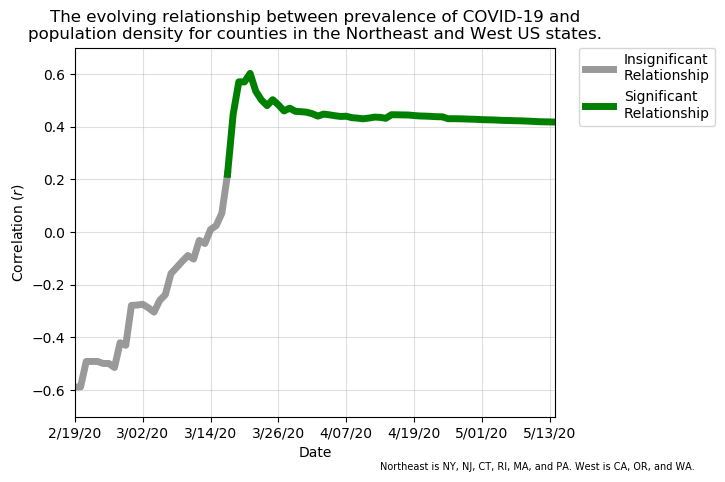

In [41]:
plt.figure(figsize=(7.4, 4.8))
plt.title('The evolving relationship between prevalence of COVID-19 and\n\
population density for counties in the Northeast and West US states.')
plt.plot([date for date in rs][start_idx:green_idx+1], 
         [rs[date] for date in rs][start_idx:green_idx+1], 
         color='grey', linewidth=5, alpha=0.8, label='Insignificant\nRelationship')

plt.plot([date for date in rs][green_idx:], 
         [rs[date] for date in rs][green_idx:], 
         color='green', linewidth=5, label='Significant\nRelationship')

plt.ylim(-0.7, 0.7)
plt.xlim([date for date in rs][start_idx], [date for date in rs][-1])
# plt.axhline(y=0, color='grey')
plt.ylabel('Correlation ($r$)')
plt.xlabel('Date')
plt.grid(alpha=0.4)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
coast_exp = 'Northeast is NY, NJ, CT, RI, MA, and PA. West is CA, OR, and WA. '
plt.tight_layout()
plt.figtext(0.52, 0.01, coast_exp, wrap=False, horizontalalignment='left', fontsize=7)
plt.xticks([date for date in rs][start_idx::12])
plt.savefig('plots/relationship.png', dpi=300)
plt.show()

In [47]:
86 / 12

7.166666666666667

In [42]:
# Manhattan
select_county1 = 'New York County'
select_state1 = 'NY'
sx1 = df.loc[(df['County Name'] == select_county1) & (df['St'] == 
                select_state1)]['density'].iloc[0]

# Seattle
select_county2 = 'King County'
select_state2 = 'WA'
sx2 = df.loc[(df['County Name'] == select_county2) & (df['St'] == 
                select_state2)]['density'].iloc[0]

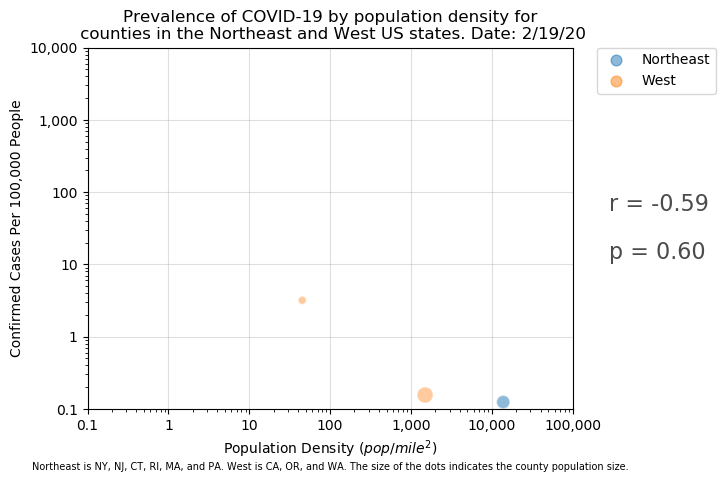

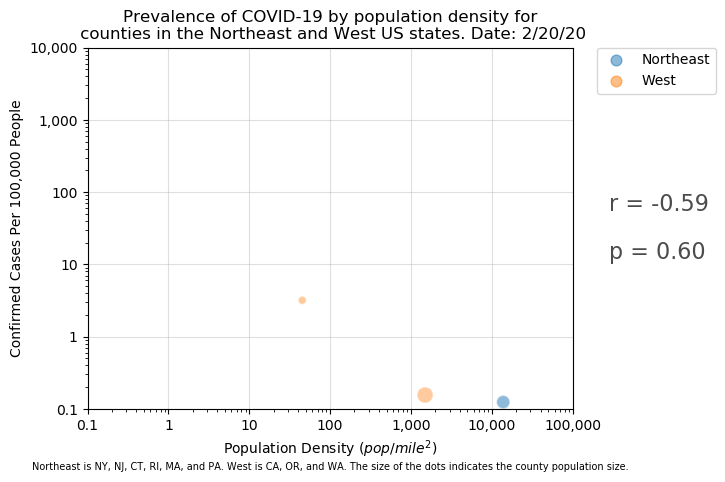

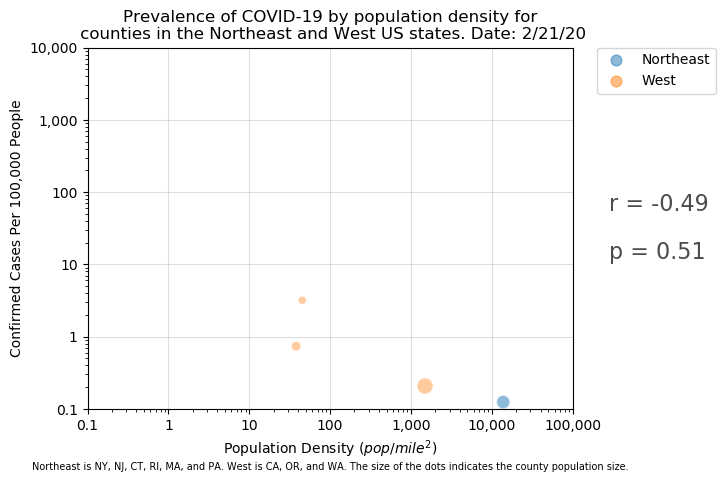

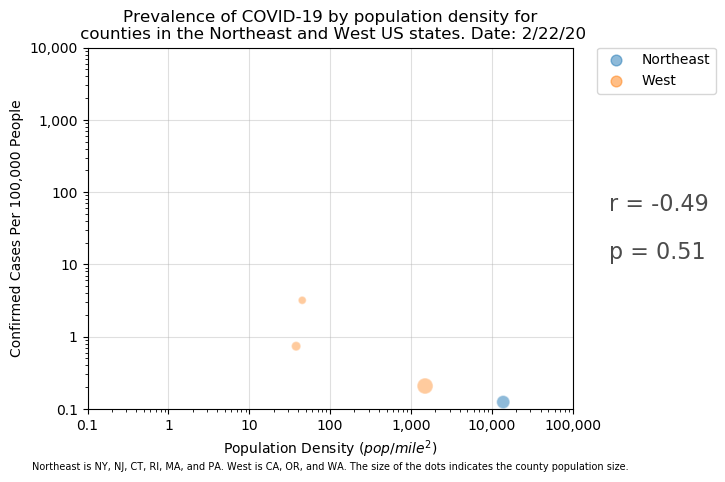

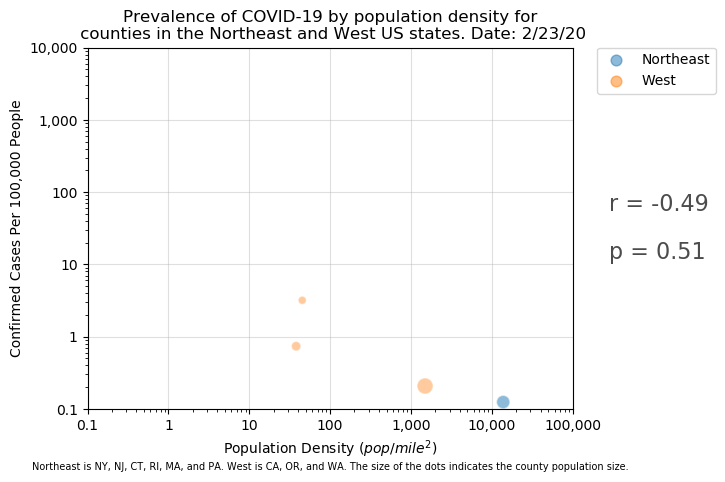

...

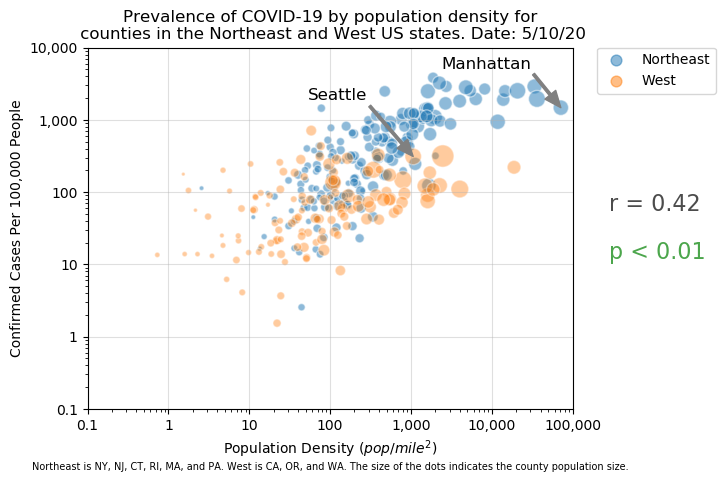

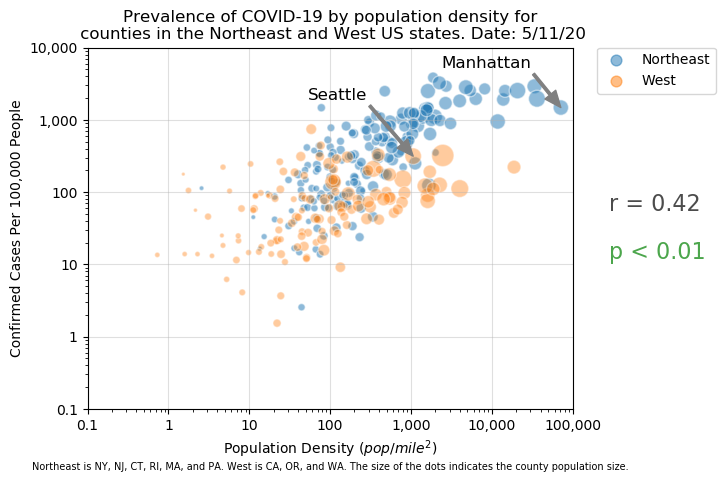

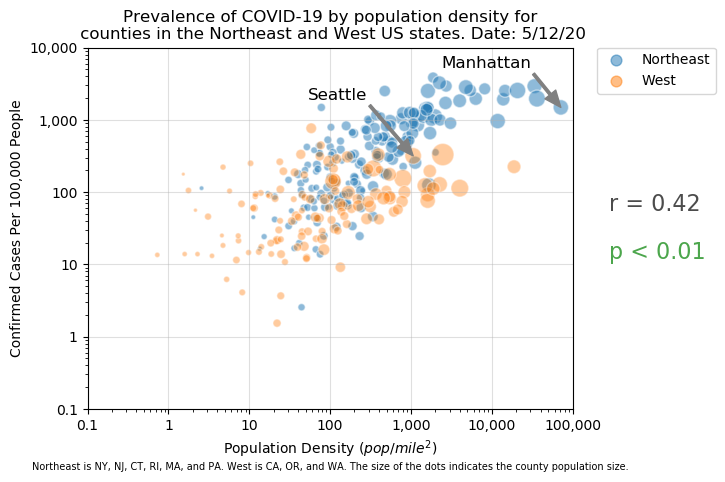

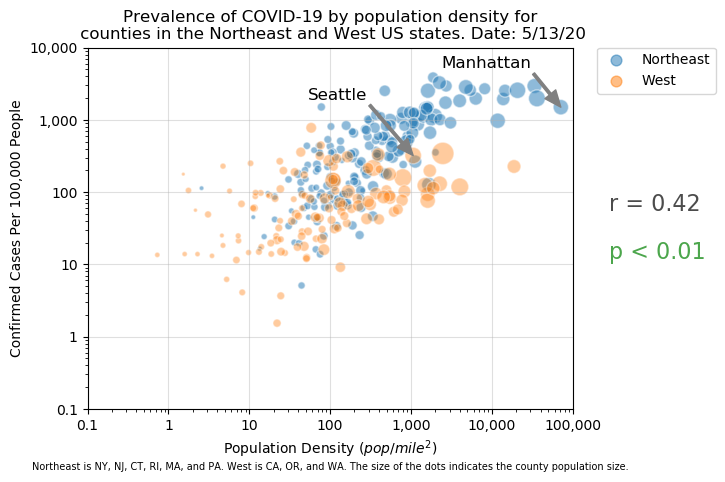

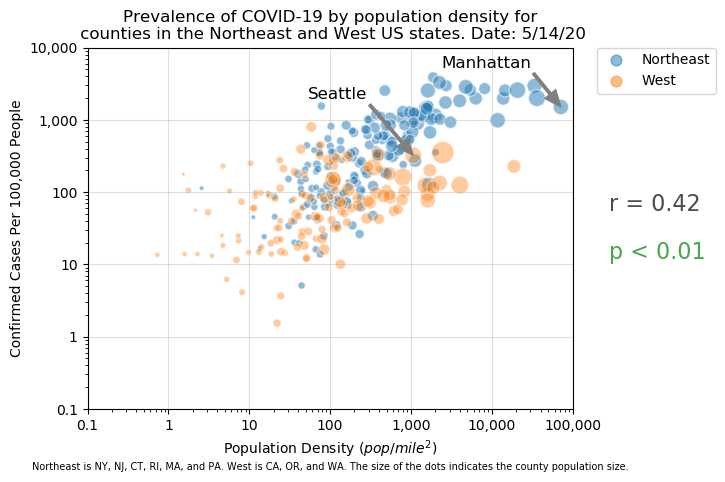

In [43]:
for i in range(33, last, 1):  # min is 5    #33
    plt.figure(figsize=(7.4, 4.8))
    date = df.columns[i]
    date = reformat(date)
    casespc_col = df.columns[i] + '_casespc'
    
    sy1 = df.loc[(df['County Name'] == select_county1) & (df['St'] == 
                select_state1)][casespc_col].iloc[0]
    sy2 = df.loc[(df['County Name'] == select_county2) & (df['St'] == 
                select_state2)][casespc_col].iloc[0]
    
    plt.scatter(east.density, east[casespc_col], 
                color=colors[0], s=east.SpecPopulation, alpha=0.5, edgecolors='w')
    
    plt.scatter(west.density, west[casespc_col], 
                color=colors[1], s=west.SpecPopulation, alpha=0.4, edgecolors='w')
    
    size_leg = 60
    plt.scatter(0, 0, s=size_leg, color=colors[0], alpha=0.5, label='Northeast')
    plt.scatter(0, 0, s=size_leg, color=colors[1], alpha=0.5, label='West')
    
    plt.xscale("log")
    plt.yscale("log")
    plt.ylabel('Cases Per 100,000 People')
    plt.xlabel('Population Density ($pop / mile^2$)')
    plt.ylim(0.1, 10_000)
    plt.xlim(0.1, 100_000)
    plt.yticks([0.1, 1, 10, 100, 1000, 10000], ['0.1', '1', '10', '100', '1,000', '10,000'])
    plt.xticks([0.1, 1, 10, 100, 1000, 10_000, 100_000], 
               ['0.1', '1', '10', '100', '1,000', '10,000', '100,000'])
    plt.ylabel('Confirmed Cases Per 100,000 People')
    plt.title('Prevalence of COVID-19 by population density for\n\
 counties in the Northeast and West US states. Date: {}'.format(date)) # ($log \,\, scale$)
    coast_exp = 'Northeast is NY, NJ, CT, RI, MA, and PA. West is CA, OR, and WA. '
    size_exp = 'The size of the dots indicates the county population size.'
    txt = coast_exp + size_exp
    plt.figtext(0.05, 0.01, txt, wrap=False, horizontalalignment='left', fontsize=7)
    plt.grid(alpha=0.4)
    
    
    if sy1 >= 0.01:
        plt.annotate('Manhattan', xytext=(sx1/30, sy1*3.5), xy=(sx1, sy1), fontsize=12,
                     arrowprops={'width':1.8, 'headwidth': 10, 'alpha':1, 'color':'grey'})
    if sy2 >= 0.01:
        plt.annotate('Seattle', xytext=(sx2/20, sy2*6), xy=(sx2, sy2), fontsize=12,
                     arrowprops={'width':1.8, 'headwidth': 10, 'alpha':1, 'color':'grey'})

    
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

    plt.tight_layout()
    
    # STATS ~~~~~~~~~~~~~~~~~~~~~
    
    r = rs[date]
    p = ps[date]
    if p < 0.01:
        p_string = 'p < 0.01'
    else:
        p_string = 'p = {:.2f}'.format(p)
    
    p_color = 'black'
    if p < 0.05:
        p_color = 'green'
        
    r_string = 'r = {:.2f}'.format(r)
    
    
    stat_x = 0.83
    stat_y = 0.55
    stat_font = 16
    plt.figtext(x=stat_x, y=stat_y, s=r_string, fontsize=stat_font, 
                alpha=0.7, color='black')
    plt.figtext(x=stat_x, y=stat_y-0.1, s=p_string, fontsize=stat_font, 
                alpha=0.7, color=p_color)
    plt.savefig('../files/gif_coast_size/casespc_{}.png'.format(i), dpi=200)
#     plt.savefig('../files/gif_columbia/casespc_{}.png'.format(i), dpi=200)
    plt.show()

Convert pngs with https://ezgif.com/maker with 0.14 seconds between `pngs`.

In [ ]:
# Columbia County
select_county2 = 'Columbia County'
select_state2 = 'NY'
sx2 = df.loc[(df['County Name'] == select_county2) & (df['St'] == 
                select_state2)]['density'].iloc[0]

plt.annotate('San Francisco', xytext=(sx2/60, sy2*3.5), xy=(sx2, sy2), 
                     arrowprops={'width':3, 'alpha':0.9, 'color':'grey'})

In [506]:
df.sort_values(by='5/12/20_casespc', ascending=False).loc[df.Coast == 'West'][:30]

,fips,land,County Name,St,Population,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,...,5/4/20_casespc,5/5/20_casespc,5/6/20_casespc,5/7/20_casespc,5/8/20_casespc,5/9/20_casespc,5/10/20_casespc,5/11/20_casespc,5/12/20_casespc,SpecPopulation
2991,53077,4295.40,Yakima County,WA,250873,0,0,0,0,0,...,546.890259,553.666596,577.583080,616.646670,629.402128,672.053190,709.920956,743.005425,763.733044,58.739012
2963,53021,1242.17,Franklin County,WA,95222,0,0,0,0,0,...,395.916910,398.017265,406.418685,421.121169,424.271702,428.472412,432.673122,441.074542,443.174897,39.869426
199,6025,4176.60,Imperial County,CA,181215,0,0,0,0,0,...,209.143835,220.732279,231.217063,251.082968,282.537318,282.537318,282.537318,311.232514,332.753911,51.573039
205,6037,4057.88,Los Angeles County,CA,10039107,0,0,0,0,1,...,261.148726,277.066476,285.324183,293.123681,301.779830,310.754731,315.536033,321.323401,330.507484,256.934901
2983,53061,2087.27,Snohomish County,WA,822083,0,0,0,0,0,...,308.606309,310.066015,314.323493,319.554108,320.405604,324.054870,326.122788,327.217568,329.772055,94.430292
2969,53033,2115.57,King County,WA,2252782,1,1,1,1,1,...,290.529665,293.903272,297.587605,302.248509,304.645545,308.374268,311.037641,313.745405,316.808284,141.329471
2981,53057,1731.20,Skagit County,WA,129205,0,0,0,0,0,...,276.305097,281.722844,293.332301,301.071940,302.619868,307.263651,310.359506,311.133470,314.229325,45.046058
228,6083,2735.09,Santa Barbara County,CA,446499,0,0,0,0,0,...,117.805415,121.836779,137.290341,161.702490,231.131537,279.955834,292.945785,305.039877,307.055559,73.973005
2955,53005,1700.38,Benton County,WA,204390,0,0,0,0,0,...,260.286707,262.733010,268.114878,269.093400,273.496746,281.324918,282.303440,286.706786,287.685308,54.116403
240,6107,4824.22,Tulare County,CA,466195,0,0,0,0,0,...,162.378404,184.043158,196.484304,207.852937,217.291048,231.448214,244.532867,248.608415,266.197621,75.261369


In [660]:
c = df.columns[7] + '_casespc'
df.loc[df[c] != 0]

,fips,land,County Name,St,Population,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,...,5/4/20_casespc,5/5/20_casespc,5/6/20_casespc,5/7/20_casespc,5/8/20_casespc,5/9/20_casespc,5/10/20_casespc,5/11/20_casespc,5/12/20_casespc,SpecPopulation
611,17031,945.33,Cook County,IL,5150233,0,0,1,1,1,...,848.796550,878.076778,906.541510,938.617729,975.412180,1003.333247,1022.380929,1036.477379,1077.038650,196.732367
2969,53033,2115.57,King County,WA,2252782,1,1,1,1,1,...,290.529665,293.903272,297.587605,302.248509,304.645545,308.374268,311.037641,313.745405,316.808284,141.329471


In [264]:
df.loc[(df['County Name'] == 'Los Angeles County') & (df['St'] == 'CA')]

,fips,land,County Name,St,Population,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,...,5/4/20_casespc,5/5/20_casespc,5/6/20_casespc,5/7/20_casespc,5/8/20_casespc,5/9/20_casespc,5/10/20_casespc,5/11/20_casespc,5/12/20_casespc,SpecPopulation
205,6037,4057.88,Los Angeles County,CA,10039107,0,0,0,0,1,...,261.148726,277.066476,285.324183,293.123681,301.77983,310.754731,315.536033,321.323401,330.507484,256.934901


In [199]:
df.sort_values(by='density', ascending=False)[:10]

,fips,land,County Name,St,Population,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,...,5/4/20_casespc,5/5/20_casespc,5/6/20_casespc,5/7/20_casespc,5/8/20_casespc,5/9/20_casespc,5/10/20_casespc,5/11/20_casespc,5/12/20_casespc,SpecPopulation
1859,36061,22.83,New York County,NY,1628706,0,0,0,0,0,...,1406.024169,1415.479528,1427.943410,1444.643785,1456.984870,1466.256034,1472.150284,1477.369151,1485.289549,165.508721
1852,36047,70.82,Kings County,NY,2559903,0,0,0,0,0,...,1843.155776,1858.625112,1874.055384,1896.556237,1914.056900,1932.143523,1946.050300,1956.011615,1966.129185,198.323057
1831,36005,42.10,Bronx County,NY,1418207,0,0,0,0,0,...,2765.675251,2783.514677,2809.110377,2833.225333,2858.045405,2877.154040,2895.134490,2911.845732,2922.069909,156.595635
1869,36081,108.53,Queens County,NY,2253858,0,0,0,0,0,...,2399.884997,2415.768873,2434.936008,2460.225977,2482.143951,2506.502184,2522.874112,2536.983253,2546.344978,188.475292
224,6075,46.87,San Francisco County,CA,881549,0,0,0,0,0,...,184.221183,196.018599,198.967953,204.866661,210.198185,214.508779,220.407487,221.655291,224.264335,129.473947
1783,34017,46.19,Hudson County,NJ,672391,0,0,0,0,0,...,2361.869805,2394.291417,2408.866270,2432.215779,2456.903796,2479.955859,2501.818139,2518.772559,2524.572756,116.180318
1230,25025,58.15,Suffolk County,MA,803907,0,0,0,0,0,...,1734.155817,1763.014876,1800.705803,1832.550283,1858.921492,1880.690179,1900.592979,1910.171201,1922.361666,124.786076
2295,42101,134.10,Philadelphia County,PA,1584064,0,0,0,0,0,...,840.622601,856.215405,867.515454,884.181447,908.044119,924.015696,939.545372,947.436467,960.693507,163.678974
320,11001,61.05,Washington,DC,705749,0,0,0,0,0,...,732.555059,754.092461,773.787848,801.134681,835.849573,864.613340,888.701224,905.279356,918.881925,118.452413
2915,51510,15.03,Alexandria City,VA,159428,0,0,0,0,0,...,589.607848,616.579271,616.579271,664.876935,696.239055,716.310811,748.300173,767.744687,777.780566,65.329546


In [156]:
df.loc[df['County Name'] == 'New York County']['Population'].iloc[0]

1628706

In [157]:
df.loc[df['County Name'] == 'New York County']['SpecPopulation'].iloc[0]

135.5548580484895

In [158]:
new_york_d = df.loc[df['County Name'] == 'New York County']['density'].iloc[0]

In [124]:
df.loc[df['County Name'] == 'New York County']['density']

1859    71340.604468
Name: density, dtype: float64

In [122]:
df.loc[df['County Name'] == 'New York County']['5/12/20_casespc'].iloc[0]

1485.2895488811362

In [156]:
df.loc[df['County Name'] == 'New York County']['Population'].iloc[0]

1628706

In [157]:
df.loc[df['County Name'] == 'New York County']['SpecPopulation'].iloc[0]

135.5548580484895

In [30]:
last

117

In [46]:
df.columns.tolist()

['fips',
 'land',
 'County Name',
 'St',
 'Population',
 '1/22/20',
 '1/23/20',
 '1/24/20',
 '1/25/20',
 '1/26/20',
 '1/27/20',
 '1/28/20',
 '1/29/20',
 '1/30/20',
 '1/31/20',
 '2/1/20',
 '2/2/20',
 '2/3/20',
 '2/4/20',
 '2/5/20',
 '2/6/20',
 '2/7/20',
 '2/8/20',
 '2/9/20',
 '2/10/20',
 '2/11/20',
 '2/12/20',
 '2/13/20',
 '2/14/20',
 '2/15/20',
 '2/16/20',
 '2/17/20',
 '2/18/20',
 '2/19/20',
 '2/20/20',
 '2/21/20',
 '2/22/20',
 '2/23/20',
 '2/24/20',
 '2/25/20',
 '2/26/20',
 '2/27/20',
 '2/28/20',
 '2/29/20',
 '3/1/20',
 '3/2/20',
 '3/3/20',
 '3/4/20',
 '3/5/20',
 '3/6/20',
 '3/7/20',
 '3/8/20',
 '3/9/20',
 '3/10/20',
 '3/11/20',
 '3/12/20',
 '3/13/20',
 '3/14/20',
 '3/15/20',
 '3/16/20',
 '3/17/20',
 '3/18/20',
 '3/19/20',
 '3/20/20',
 '3/21/20',
 '3/22/20',
 '3/23/20',
 '3/24/20',
 '3/25/20',
 '3/26/20',
 '3/27/20',
 '3/28/20',
 '3/29/20',
 '3/30/20',
 '3/31/20',
 '4/1/20',
 '4/2/20',
 '4/3/20',
 '4/4/20',
 '4/5/20',
 '4/6/20',
 '4/7/20',
 '4/8/20',
 '4/9/20',
 '4/10/20',
 '4/11/20',

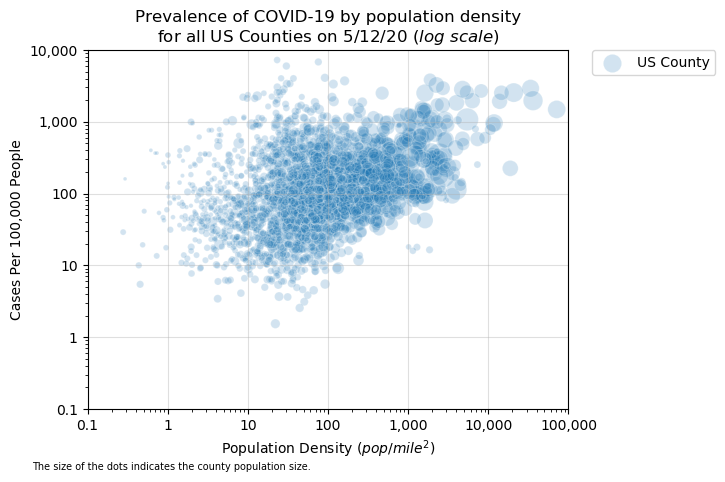

In [217]:
for i in range(last - 1, last):  # min is 5   30
    plt.figure(figsize=(7.4, 4.8))
    date = df.columns[i]
    casespc_col = df.columns[i] + '_casespc'
    
    date = reformat(date)

    sns.scatterplot(x='density', y=casespc_col, data=df,
                    s=df['SpecPopulation'], alpha=0.2, label='US County')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.xscale("log")
    plt.yscale("log")
    plt.yticks([0.1, 1, 10, 100, 1000, 10_000], ['0.1', '1', '10', '100', '1,000', '10,000'])
    plt.xticks([0.1, 1, 10, 100, 1000, 10_000, 100_000], 
               ['0.1', '1', '10', '100', '1,000', '10,000', '100,000'])
    plt.ylabel('Cases Per 100,000 People')
    plt.xlabel('Population Density ($pop / mile^2$)')
    plt.ylim(0.1, 10_000)
    plt.xlim(0.1, 100_000)
    plt.title('Prevalence of COVID-19 by population density\n\
for all US Counties on {} ($log \,\, scale$)'.format(date))
    size_exp = 'The size of the dots indicates the county population size.'
    txt = size_exp
    plt.figtext(0.05, 0.01, txt, wrap=False, horizontalalignment='left', fontsize=7)
    plt.grid(alpha=0.4)
    plt.tight_layout()
    plt.savefig('../files/gif_size_all/casespc_{}.png'.format(i), dpi=200)
    plt.show()

In [281]:
df.loc

,fips,land,County Name,St,population,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,...,1/27/20_casespc,1/28/20_casespc,1/29/20_casespc,1/30/20_casespc,1/31/20_casespc,2/1/20_casespc,2/2/20_casespc,2/3/20_casespc,2/4/20_casespc,2/5/20_casespc
0,1001,594.44,Autauga County,AL,55869,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1003,1589.78,Baldwin County,AL,223234,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1005,884.88,Barbour County,AL,24686,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1007,622.58,Bibb County,AL,22394,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1009,644.78,Blount County,AL,57826,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,56037,10426.65,Sweetwater County,WY,42343,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3138,56039,3995.38,Teton County,WY,23464,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3139,56041,2081.26,Uinta County,WY,20226,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3140,56043,2238.55,Washakie County,WY,7805,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [18]:
# df['State'] df.rename(columns={'St':'State'})

In [10]:
df

,fips,land,County Name,St,Population,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,...,4/4/20_casespc,4/5/20_casespc,4/6/20_casespc,4/7/20_casespc,4/8/20_casespc,4/9/20_casespc,4/10/20_casespc,4/11/20_casespc,4/12/20_casespc,4/13/20_casespc
0,1001,594.44,Autauga County,AL,55869,0,0,0,0,0,...,21.478817,21.478817,21.478817,21.478817,21.478817,30.428323,30.428323,34.008126,34.008126,34.008126
1,1003,1589.78,Baldwin County,AL,223234,0,0,0,0,0,...,12.990853,15.230655,17.022497,18.814338,21.950061,26.429666,26.429666,29.565389,31.805191,34.940914
2,1005,884.88,Barbour County,AL,24686,0,0,0,0,0,...,8.101758,8.101758,12.152637,12.152637,12.152637,28.356153,36.457911,40.508790,40.508790,36.457911
3,1007,622.58,Bibb County,AL,22394,0,0,0,0,0,...,17.861927,31.258373,31.258373,35.723855,40.189336,49.120300,49.120300,58.051264,71.447709,75.913191
4,1009,644.78,Blount County,AL,57826,0,0,0,0,0,...,17.293259,17.293259,17.293259,17.293259,17.293259,19.022585,20.751911,20.751911,22.481237,25.939889
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,56037,10426.65,Sweetwater County,WY,42343,0,0,0,0,0,...,9.446662,11.808327,11.808327,14.169993,14.169993,14.169993,16.531658,16.531658,16.531658,21.254989
3138,56039,3995.38,Teton County,WY,23464,0,0,0,0,0,...,153.426526,166.212070,170.473917,187.521309,191.783157,213.092397,225.877941,225.877941,238.663484,238.663484
3139,56041,2081.26,Uinta County,WY,20226,0,0,0,0,0,...,9.888263,9.888263,14.832394,14.832394,14.832394,19.776525,19.776525,19.776525,19.776525,19.776525
3140,56043,2238.55,Washakie County,WY,7805,0,0,0,0,0,...,25.624600,51.249199,51.249199,64.061499,64.061499,64.061499,64.061499,64.061499,64.061499,64.061499


In [56]:
states_dic = {
        'AK': 'Alaska',
        'AL': 'Alabama',
        'AR': 'Arkansas',
        'AS': 'American Samoa',
        'AZ': 'Arizona',
        'CA': 'California',
        'CO': 'Colorado',
        'CT': 'Connecticut',
        'DC': 'District of Columbia',
        'DE': 'Delaware',
        'FL': 'Florida',
        'GA': 'Georgia',
        'GU': 'Guam',
        'HI': 'Hawaii',
        'IA': 'Iowa',
        'ID': 'Idaho',
        'IL': 'Illinois',
        'IN': 'Indiana',
        'KS': 'Kansas',
        'KY': 'Kentucky',
        'LA': 'Louisiana',
        'MA': 'Massachusetts',
        'MD': 'Maryland',
        'ME': 'Maine',
        'MI': 'Michigan',
        'MN': 'Minnesota',
        'MO': 'Missouri',
        'MP': 'Northern Mariana Islands',
        'MS': 'Mississippi',
        'MT': 'Montana',
        'NA': 'National',
        'NC': 'North Carolina',
        'ND': 'North Dakota',
        'NE': 'Nebraska',
        'NH': 'New Hampshire',
        'NJ': 'New Jersey',
        'NM': 'New Mexico',
        'NV': 'Nevada',
        'NY': 'New York',
        'OH': 'Ohio',
        'OK': 'Oklahoma',
        'OR': 'Oregon',
        'PA': 'Pennsylvania',
        'PR': 'Puerto Rico',
        'RI': 'Rhode Island',
        'SC': 'South Carolina',
        'SD': 'South Dakota',
        'TN': 'Tennessee',
        'TX': 'Texas',
        'UT': 'Utah',
        'VA': 'Virginia',
        'VI': 'Virgin Islands',
        'VT': 'Vermont',
        'WA': 'Washington',
        'WI': 'Wisconsin',
        'WV': 'West Virginia',
        'WY': 'Wyoming'
}

In [57]:
def states_func(row):
    return states_dic[row.St]

In [59]:
df['State'] = df.apply(states_func, axis='columns')

In [60]:
state_list = df.State.unique()

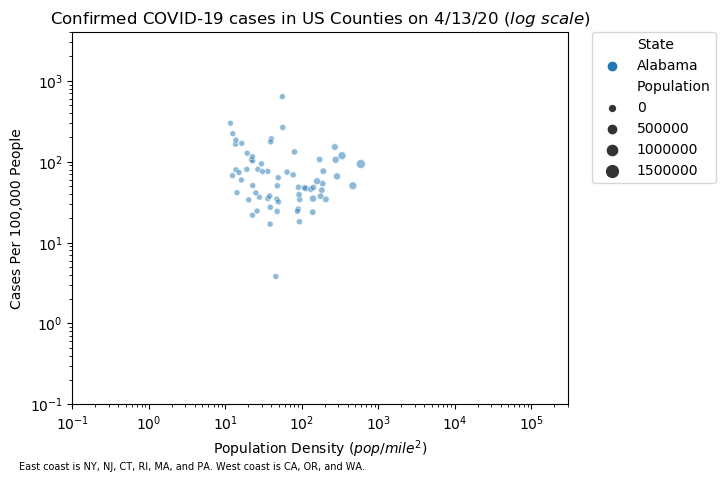

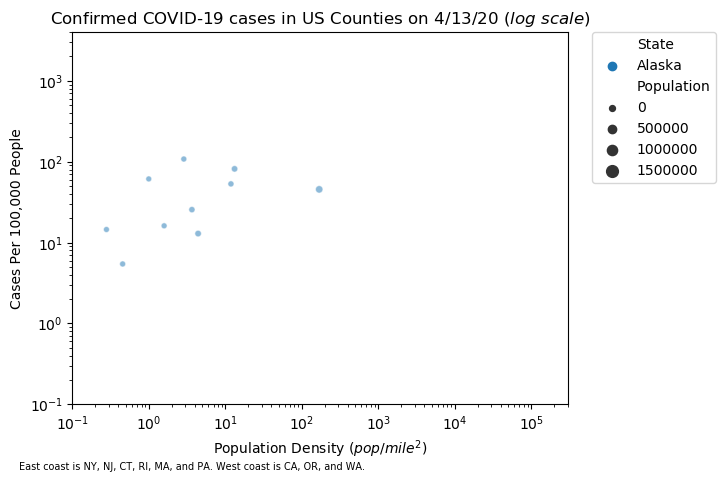

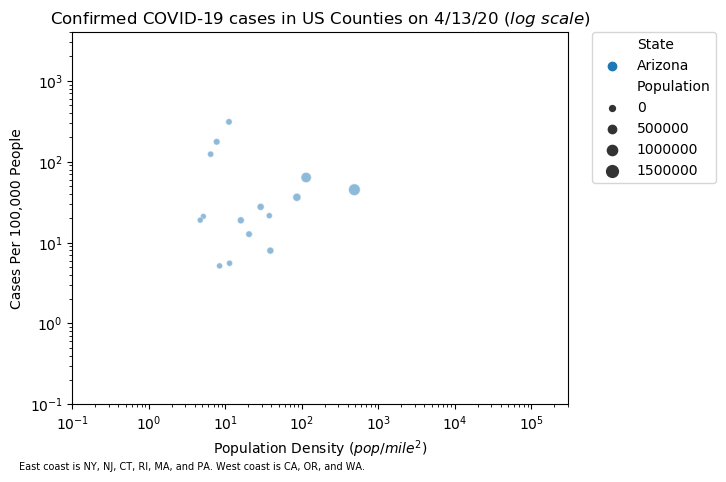

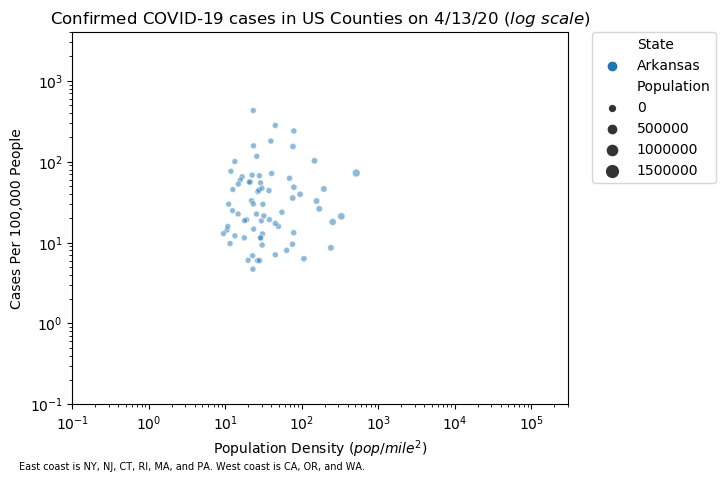

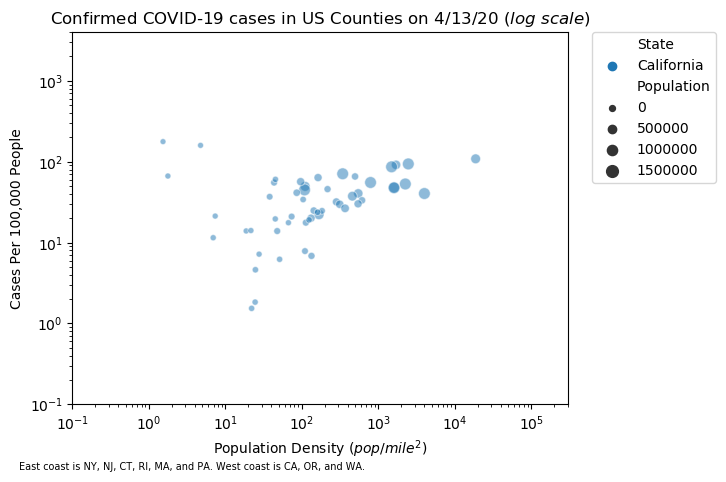

...

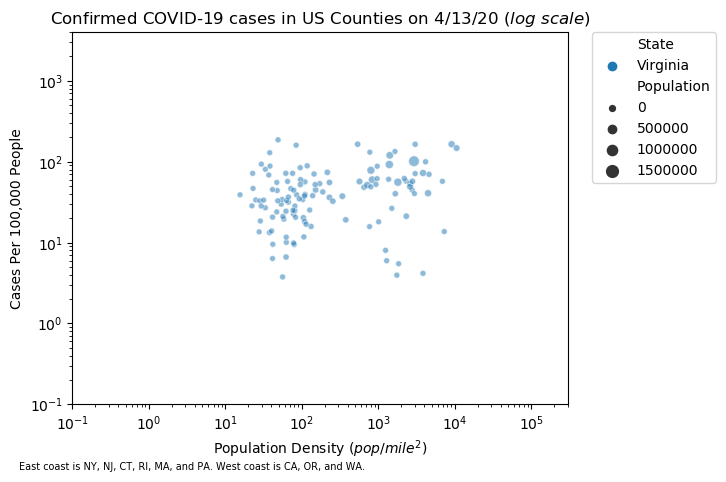

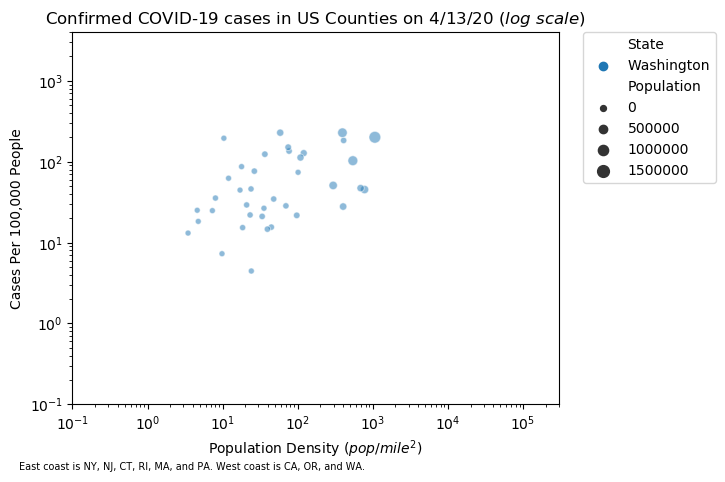

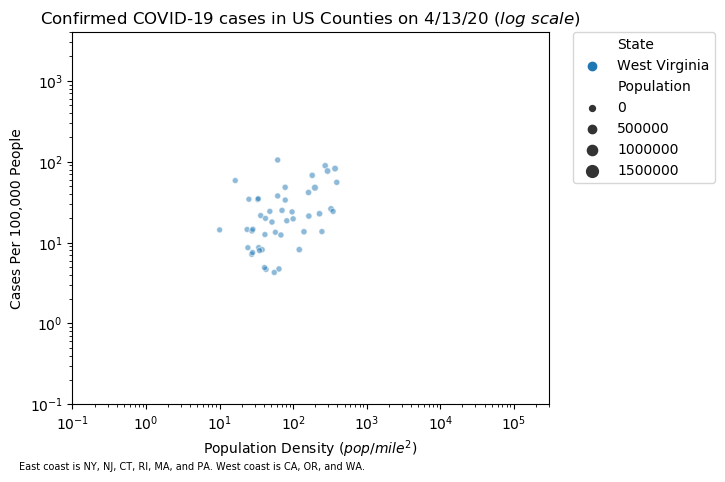

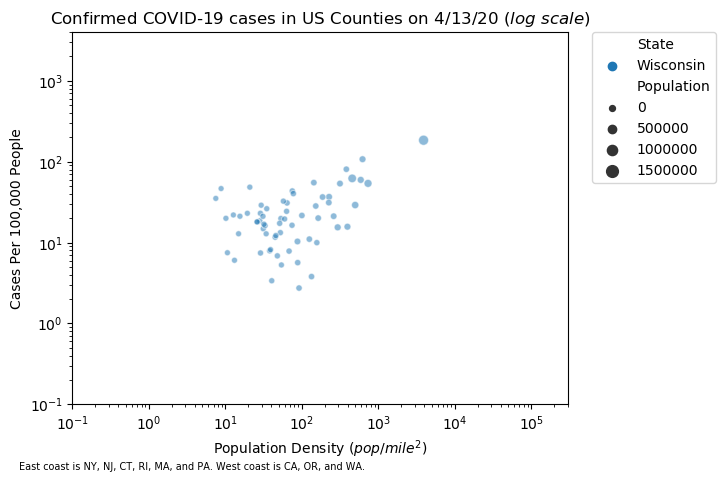

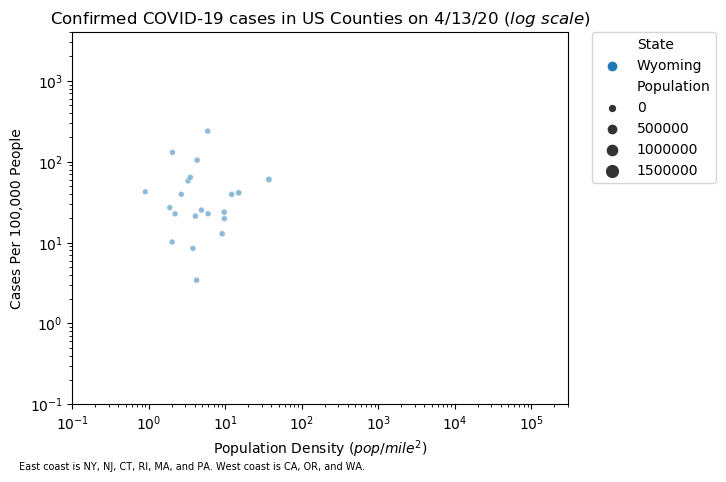

In [65]:
for i in range(len(state_list)):
    plt.figure(figsize=(7.4, 4.8))
    date = '4/13/20'
    casespc_col = date + '_casespc'
    sns.scatterplot(x='density', y=casespc_col, hue='State', 
#                     palette=sns.color_palette()[:2], 
                    size='Population',
                    size_norm=(0, 1_500_000),
                    data=df.loc[(df['State'] == state_list[i])], 
                                alpha=0.5)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.xscale("log")
    plt.yscale("log")
    plt.ylabel('Cases Per 100,000 People')
    plt.xlabel('Population Density ($pop / mile^2$)')
    plt.ylim(0.1, 4000)
    plt.xlim(0.1, 300_000)
    plt.title('Confirmed COVID-19 cases in US Counties on {} ($log \,\, scale$)'.format(date))
    txt = '\n\nEast coast is NY, NJ, CT, RI, MA, and PA. West coast is CA, OR, and WA.'
    plt.figtext(0.5, 0.01, txt, wrap=False, horizontalalignment='right', fontsize=7)
    plt.tight_layout()
    plt.savefig('gif_state_size/casespc_{}.png'.format(state_list[i]), dpi=300)
    plt.show()

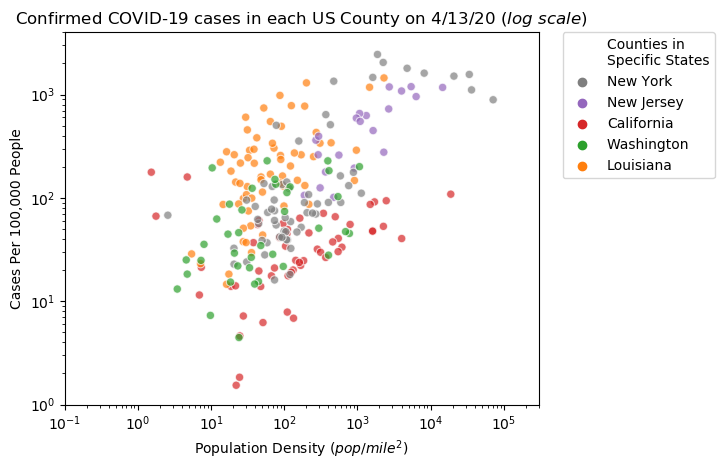

In [240]:
for i in range(87, 88):  # min is 5
    plt.figure(figsize=(7.4, 4.8))
    date = df.columns[i]
    casespc_col = df.columns[i] + '_casespc'
    df[casespc_col] = (df.iloc[:,i] / df.population) * 100_000
    
#     sns.scatterplot(x='density', y=casespc_col,
#                 color=sns.color_palette()[0], 
#                 data=df.loc[(df['Counties in\nSpecific States'] == 'Other States')], 
#                 alpha=0.17)
    sns.scatterplot(x='density', y=casespc_col, hue='Counties in\nSpecific States', 
                    palette=colors, # size='population',
                    # size_norm=(0, 400_000),
                    data=df.loc[(df['Counties in\nSpecific States'] == 'New York') | 
                                (df['Counties in\nSpecific States'] == 'New Jersey') | 
                                (df['Counties in\nSpecific States'] == 'California') |
                                (df['Counties in\nSpecific States'] == 'Washington') |
                               (df['Counties in\nSpecific States'] == 'Louisiana')] , 
                                hue_order=['New York', 'New Jersey', 'California', 
                                           'Washington', 'Louisiana'], 
                                alpha=0.7)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.xscale("log")
    plt.yscale("log")
    plt.ylabel('Cases Per 100,000 People')
    plt.xlabel('Population Density ($pop / mile^2$)')
    plt.ylim(0.1, 4000)
    plt.xlim(0.1, 300_000)
    plt.title('Confirmed COVID-19 cases in each US County on {} ($log \,\, scale$)'.format(
            date))
    plt.tight_layout()
#     plt.savefig('gif/casespc_{}.png'.format(i), dpi=300)
    plt.show()

In [317]:
df.loc[221,'population']

62808

In [316]:
df.loc[221,'2/28/20']

2

In [312]:
2 / 62808

3.184307731499172e-05

In [320]:
df[['2/28/20', 'County Name']].sort_values(by='2/28/20', ascending=False)

,2/28/20,County Name
220,2,Sacramento County
611,2,Cook County
221,2,San Benito County
223,2,San Diego County
229,2,Santa Clara County
...,...,...
1055,0,Larue County
1056,0,Laurel County
1057,0,Lawrence County
1058,0,Lee County


In [319]:
df[['2/28/20_casespc', 'County Name']].sort_values(by='2/28/20_casespc', ascending=False)

,2/28/20_casespc,County Name
221,3.184308,San Benito County
198,0.737692,Humboldt County
220,0.128861,Sacramento County
1230,0.124392,Suffolk County
229,0.103742,Santa Clara County
...,...,...
1059,0.000000,Leslie County
1060,0.000000,Letcher County
3141,0.000000,Weston County
92,NaN,Wade Hampton Census Area


In [140]:
# 

In [35]:
colors

[(0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (1.0, 0.4980392156862745, 0.054901960784313725)]

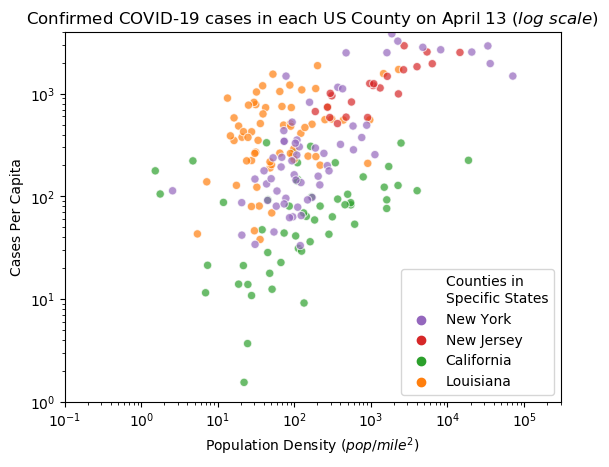

In [37]:
# sns.scatterplot(x='density', y='5/12/20_casespc',
#                 color=sns.color_palette()[0], 
#                 data=df.loc[(df['Counties in\nSpecific States'] == 'Other States')], 
#                 alpha=0.17)
sns.scatterplot(x='density', y='5/12/20_casespc', hue='Counties in\nSpecific States', 
                palette=colors[1:], 
                data=df.loc[(df['Counties in\nSpecific States'] == 'New York') | 
                            (df['Counties in\nSpecific States'] == 'New Jersey') | 
                            (df['Counties in\nSpecific States'] == 'California') |
                           (df['Counties in\nSpecific States'] == 'Louisiana')] , 
                            hue_order=['New York', 'New Jersey', 'California', 'Louisiana'], 
                            alpha=0.7)
plt.xscale("log")
plt.yscale("log")
plt.ylabel('Cases Per Capita')
plt.xlabel('Population Density ($pop / mile^2$)')
plt.ylim(1, 4000)
plt.xlim(0.1, 300_000)
plt.title('Confirmed COVID-19 cases in each US County on April 13 ($log \,\, scale$)')
# plt.savefig('casespc.png', dpi=300)
plt.show()

In [145]:
sns.regplot(df.density, df.casespc, scatter=True, scatter_kws={'alpha':0.2})
plt.xscale("log")
plt.yscale("log")
plt.ylabel('Cases Per 100,000 population')
plt.xlabel('Population Density ($pop / mile^2$)')
plt.ylim(1, 4000)

In [490]:
x = df.loc[(df.casespc > 0) & (df.casespc < np.float('inf'))].density
y = df.loc[(df.casespc > 0) & (df.casespc < np.float('inf'))].casespc

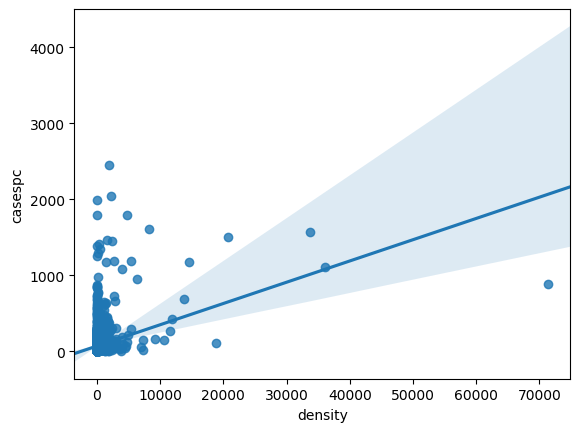

In [491]:
sns.regplot(x, y)

In [499]:
np.corrcoef(x, y)

array([[1.        , 0.33060755],
       [0.33060755, 1.        ]])

(0.1, 100000)

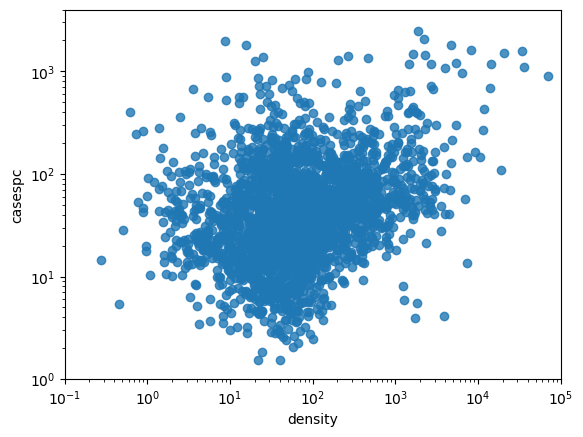

In [455]:
sns.regplot(x='density', y='casespc', data=df, fit_reg=True)
plt.xscale("log")
plt.yscale("log")
plt.ylim(1, 4000)
plt.xlim(0.1, 100_000)

In [458]:
np.polyfit(df.density, df.casespc, 1)

LinAlgError: SVD did not converge in Linear Least Squares

In [313]:
df.sort_values(by='casespc', ascending=False)

,fips,cases,County Name,State,population,land,pop,density,casespc,spec
186,6000,21,Grand Princess Cruise Ship,CA,0,155779.22,239.1,0.000000,inf,CA
1872,36087,7965,Rockland County,NY,325789,173.55,1795.9,1877.205416,2444.833926,NY
1888,36119,19786,Westchester County,NY,967506,430.50,2204.7,2247.400697,2045.051917,NY
558,16013,458,Blaine County,ID,23021,2643.59,8.1,8.708234,1989.487859,None
507,13243,122,Randolph County,GA,6778,428.24,18.0,15.827573,1799.940986,None
...,...,...,...,...,...,...,...,...,...,...
835,19091,0,Humboldt County,IA,9558,434.35,22.6,22.005295,0.000000,None
825,19071,0,Fremont County,IA,6960,511.15,14.6,13.616355,0.000000,None
823,19067,0,Floyd County,IA,15642,500.63,32.6,31.244632,0.000000,None
3141,56045,0,Weston County,WY,6927,2398.09,3.0,2.888549,0.000000,None


In [379]:
df.sort_values(by='population')

,fips,cases,County Name,St,population,land,pop,density,casespc,spec,states,States
186,6000,21,Grand Princess Cruise Ship,CA,0,155779.22,239.1,0.000000,inf,CA,CA,CA
92,2270,0,Wade Hampton Census Area,AK,0,17081.43,0.4,0.000000,NaN,Other States,Other States,Other States
549,15005,0,Kalawao County,HI,86,11.99,7.5,7.172644,0.000000,Other States,Other States,Other States
2673,48301,0,Loving County,TX,169,668.93,0.1,0.252642,0.000000,Other States,Other States,Other States
2657,48269,0,King County,TX,272,910.87,0.3,0.298616,0.000000,Other States,Other States,Other States
...,...,...,...,...,...,...,...,...,...,...,...,...
223,6073,1847,San Diego County,CA,3338330,4206.63,735.8,793.587741,55.327065,CA,CA,CA
103,4013,2020,Maricopa County,AZ,4485414,9200.14,414.9,487.537581,45.034862,Other States,Other States,Other States
2623,48201,3629,Harris County,TX,4713325,1703.48,2402.4,2766.880151,76.994478,Other States,Other States,Other States
611,17031,15474,Cook County,IL,5150233,945.33,5495.1,5448.079507,300.452426,Other States,Other States,Other States


In [127]:
import plotly.figure_factory as ff

import numpy as np
import pandas as pd

df_sample = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/laucnty16.csv')
df_sample['State FIPS Code'] = df_sample['State FIPS Code'].apply(lambda x: str(x).zfill(2))
df_sample['County FIPS Code'] = df_sample['County FIPS Code'].apply(lambda x: str(x).zfill(3))
df_sample['FIPS'] = df_sample['State FIPS Code'] + df_sample['County FIPS Code']

colorscale = ["#f7fbff","#ebf3fb","#deebf7","#d2e3f3","#c6dbef","#b3d2e9","#9ecae1",
              "#85bcdb","#6baed6","#57a0ce","#4292c6","#3082be","#2171b5","#1361a9",
              "#08519c","#0b4083","#08306b"]
endpts = list(np.linspace(1, 12, len(colorscale) - 1))
fips = df_sample['FIPS'].tolist()
values = df_sample['Unemployment Rate (%)'].tolist()

fig = ff.create_choropleth(
    fips=fips, values=values,
#     binning_endpoints=endpts,
#     colorscale=colorscale,
#     show_state_data=False,
#     show_hover=True, centroid_marker={'opacity': 0},
#     asp=2.9, title='USA by Unemployment %',
#     legend_title='% unemployed'
)

fig.layout.template = None
fig.show()

In [103]:
df_sample['FIPS']

0       01001
1       01003
2       01005
3       01007
4       01009
        ...  
3214    72145
3215    72147
3216    72149
3217    72151
3218    72153
Name: FIPS, Length: 3219, dtype: object

In [105]:
dfl = dfl.sort_values(by='fips')

In [131]:
dfl.land

0       3531905.43
1         50645.33
2           594.44
3          1589.78
4           884.88
           ...    
3190      10426.65
3191       3995.38
3192       2081.26
3193       2238.55
3194       2398.09
Name: land, Length: 3195, dtype: float64

In [268]:
colorscale = ["#f7fbff","#ebf3fb","#deebf7","#d2e3f3","#c6dbef","#b3d2e9","#9ecae1",
              "#85bcdb","#6baed6","#57a0ce","#4292c6","#3082be","#2171b5","#1361a9",
              "#08519c","#0b4083","#08306b"]
endpts = list(np.linspace(1, 12, len(colorscale) - 1))
fips = dfl.fips.tolist()
values = dfl.land.tolist()

fig = ff.create_choropleth(
    fips=fips, values=values,
    binning_endpoints=endpts,
    colorscale=colorscale,
    show_state_data=False,
    show_hover=True, centroid_marker={'opacity': 0},
    asp=2.9, title='USA by Unemployment %',
    legend_title='% unemployed'
)

fig.layout.template = None
fig.show()

NameError: name 'np' is not defined

In [111]:
df_sample['FIPS']

0       01001
1       01003
2       01005
3       01007
4       01009
        ...  
3214    72145
3215    72147
3216    72149
3217    72151
3218    72153
Name: FIPS, Length: 3219, dtype: object

In [115]:
dfl.fips = dfl.fips.astype('object')

In [122]:
dfl.fips

0           0
1        1000
2        1001
3        1003
4        1005
        ...  
3190    56037
3191    56039
3192    56041
3193    56043
3194    56045
Name: fips, Length: 3195, dtype: object

In [124]:
dfl.fips = dfl.fips.apply(lambda x: str(x).zfill(5))

In [129]:
dfl.values

array([['00000', 3531905.43, 87.4],
       ['01000', 50645.33, 94.4],
       ['01001', 594.44, 91.8],
       ...,
       ['56041', 2081.26, 10.1],
       ['56043', 2238.55, 3.8],
       ['56045', 2398.09, 3.0]], dtype=object)